In [1]:
import numpy as np #linear algebra
import pandas as pd #data manipulation and analysis
import seaborn as sns #data visualization
import matplotlib.pyplot as plt #data








# visualization
import sklearn.preprocessing as skp #machine learning (preprocessing)
import sklearn.cluster as skc #machine learning (clustering)
import warnings # ignore warnings
warnings.filterwarnings('ignore')


## INTRO TO DATA

In [2]:
df = pd.read_csv('/Users/louie/College/JupyterPractice/Pipe/20K_cases_data_anonymized_label_encoded_v3.csv')

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20004 entries, 0 to 20003
Data columns (total 19 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   case_nbr              20000 non-null  float64
 1   created_dts           20000 non-null  object 
 2   created_date          20000 non-null  object 
 3   close_dts             19975 non-null  object 
 4   last_updated_dts      20000 non-null  object 
 5   contact_method        20000 non-null  float64
 6   tag_id                20000 non-null  float64
 7   prod_desc             20000 non-null  float64
 8   country_name_dawn     19433 non-null  object 
 9   contact_method_name   20000 non-null  float64
 10  system_age            20000 non-null  float64
 11  total_inbounf_count   19738 non-null  float64
 12  dispatch_number       20000 non-null  float64
 13  parts_only            20000 non-null  float64
 14  commodity_desc        20000 non-null  float64
 15  dps_classification 

In [4]:
df.describe()

,case_nbr,contact_method,tag_id,prod_desc,contact_method_name,system_age,total_inbounf_count,dispatch_number,parts_only,commodity_desc,dps_classification,total_activity_count,warranty_status,new_warranty_type
count,20000.000000,20000.000000,20000.000000,20000.000000,20000.00000,20000.000000,19738.000000,20000.000000,20000.0,20000.000000,20000.0,18284.000000,20000.000000,20000.000000
mean,9408.493800,2.759800,9224.546250,8.297350,0.89780,1764.746500,3.074830,9952.192850,1.0,0.211350,0.0,8.060381,0.107800,6.190550
std,5435.213226,0.602098,5370.891902,2.833114,0.92255,6929.217548,2.065828,5743.441076,0.0,0.408276,0.0,7.992323,0.327848,3.893803
min,1.000000,0.000000,1.000000,0.000000,0.00000,-1493.000000,0.000000,1.000000,1.0,0.000000,0.0,1.000000,0.000000,0.000000
25%,4703.750000,3.000000,4561.750000,7.000000,0.00000,246.750000,2.000000,4977.750000,1.0,0.000000,0.0,4.000000,0.000000,2.000000
50%,9421.500000,3.000000,9210.500000,8.000000,1.00000,621.000000,3.000000,9957.500000,1.0,0.000000,0.0,5.000000,0.000000,9.000000
75%,14135.250000,3.000000,13888.250000,8.000000,2.00000,976.000000,3.000000,14925.250000,1.0,0.000000,0.0,9.000000,0.000000,9.000000
max,18811.000000,3.000000,18561.000000,19.000000,2.00000,43514.000000,49.000000,19894.000000,1.0,1.000000,0.0,136.000000,2.000000,9.000000


### Drop unnecessary Columns

In [5]:
# Specify the cols to drop
to_drop = [
    'parts_only', 'dps_classification', "dispatch_number"
]

# Drop them
df.drop(to_drop, axis='columns', inplace=True)

### Distribution of Columns

In [6]:
# # Visualize the distribution of each variable.
# plt.figure(figsize=(12,16))
# for i, j in enumerate(df.describe().columns):
#     plt.subplot(5,2, i+1)
#     sns.distplot(x=df[j])
#     plt.xlabel(j)
#     plt.title('{} Distribution'.format(j))
#     plt.subplots_adjust(wspace=.2, hspace=.5)
#     plt.tight_layout()
# plt.show()

## OUTLIERS FOR SYSTEM_AGE

In [7]:

df.loc[df['system_age'] > 10000

       ]

,case_nbr,created_dts,created_date,close_dts,last_updated_dts,contact_method,tag_id,prod_desc,country_name_dawn,contact_method_name,system_age,total_inbounf_count,commodity_desc,total_activity_count,warranty_status,new_warranty_type
37,38.0,00:08:57,5/21/2018 0:00,00:05:04,00:20:29,3.0,38.0,8.0,NaN,0.0,43239.0,2.0,0.0,27.0,0.0,9.0
58,59.0,00:48:44,10/08/2018 00:00,00:42:09,00:42:09,1.0,59.0,7.0,NaN,1.0,43379.0,2.0,0.0,11.0,0.0,9.0
64,65.0,00:26:27,02/01/2019 00:00,00:38:37,00:52:00,3.0,65.0,7.0,NaN,0.0,43495.0,5.0,0.0,8.0,1.0,4.0
105,106.0,00:07:58,12/19/2018 0:00,00:44:38,00:37:32,3.0,106.0,13.0,NaN,0.0,43451.0,0.0,0.0,NaN,1.0,4.0
164,165.0,00:31:52,6/16/2018 0:00,00:42:02,00:20:31,3.0,165.0,7.0,NaN,0.0,43265.0,2.0,0.0,8.0,1.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19811,18678.0,00:06:43,12/18/2018 0:00,00:10:37,00:21:16,2.0,18432.0,7.0,NaN,2.0,43450.0,3.0,0.0,16.0,2.0,0.0
19833,18696.0,00:55:29,12/03/2018 00:00,00:18:21,00:44:49,3.0,18449.0,7.0,NaN,0.0,43435.0,6.0,0.0,21.0,1.0,4.0
19868,18726.0,00:00:53,6/19/2018 0:00,00:34:06,00:20:57,3.0,18479.0,7.0,NaN,0.0,43268.0,2.0,0.0,8.0,2.0,0.0
19891,18696.0,00:55:29,12/03/2018 00:00,00:18:21,00:44:49,3.0,18449.0,7.0,NaN,0.0,43435.0,6.0,0.0,21.0,1.0,4.0


In [8]:
df.system_age[df['system_age'] > 10000] = None

### Filling missing data with mean

In [9]:
df.system_age[df['system_age'] < 0] = None
df.system_age.fillna(df.system_age.mean(), inplace=True)


In [10]:
df.loc[df['system_age'].isnull()
       ]

,case_nbr,created_dts,created_date,close_dts,last_updated_dts,contact_method,tag_id,prod_desc,country_name_dawn,contact_method_name,system_age,total_inbounf_count,commodity_desc,total_activity_count,warranty_status,new_warranty_type


## DROPPING DUPLICATE ROWS

In [11]:
df.duplicated().sum()

1050

In [12]:
df.loc[df.
       duplicated(), :]

,case_nbr,created_dts,created_date,close_dts,last_updated_dts,contact_method,tag_id,prod_desc,country_name_dawn,contact_method_name,system_age,total_inbounf_count,commodity_desc,total_activity_count,warranty_status,new_warranty_type
3590,10.0,00:35:43,2/20/2019 0:00,00:42:10,00:14:32,3.0,10.0,8.0,Brazil,2.0,807.000000,3.0,0.0,4.0,0.0,9.0
3592,12.0,00:35:20,1/31/2019 0:00,00:51:32,00:34:15,3.0,12.0,8.0,Japan,2.0,861.000000,5.0,0.0,8.0,0.0,9.0
3612,33.0,00:26:58,2/21/2019 0:00,00:38:18,00:46:02,3.0,33.0,8.0,India,2.0,1077.000000,3.0,0.0,10.0,0.0,0.0
3622,44.0,00:32:03,02/07/2019 00:00,00:24:16,00:51:42,3.0,44.0,5.0,Korea,2.0,375.000000,5.0,1.0,34.0,0.0,0.0
3637,60.0,00:14:23,12/06/2018 00:00,00:50:33,00:49:45,1.0,60.0,7.0,United States,1.0,598.000000,2.0,0.0,4.0,0.0,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19998,9652.0,00:24:55,12/25/2018 0:00,00:11:44,00:08:59,3.0,9569.0,7.0,Japan,2.0,391.000000,8.0,0.0,24.0,0.0,9.0
19999,9652.0,00:24:55,12/25/2018 0:00,00:11:44,00:08:59,3.0,9569.0,7.0,Japan,2.0,391.000000,8.0,0.0,24.0,0.0,9.0
20001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,692.562918,NaN,NaN,NaN,NaN,NaN
20002,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,692.562918,NaN,NaN,NaN,NaN,NaN


In [13]:
df = df.drop_duplicates(keep=False)

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18146 entries, 0 to 19993
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   case_nbr              18146 non-null  float64
 1   created_dts           18146 non-null  object 
 2   created_date          18146 non-null  object 
 3   close_dts             18123 non-null  object 
 4   last_updated_dts      18146 non-null  object 
 5   contact_method        18146 non-null  float64
 6   tag_id                18146 non-null  float64
 7   prod_desc             18146 non-null  float64
 8   country_name_dawn     17602 non-null  object 
 9   contact_method_name   18146 non-null  float64
 10  system_age            18146 non-null  float64
 11  total_inbounf_count   17911 non-null  float64
 12  commodity_desc        18146 non-null  float64
 13  total_activity_count  16515 non-null  float64
 14  warranty_status       18146 non-null  float64
 15  new_warranty_type  

## CONVERTING TO DATETIME + CREATING NEW COLUMN

In [15]:
dft = df.copy()
dft["close_dts"] = pd.to_datetime(df.close_dts, format="%H:%M:%S", errors='raise')
dft["close_dts"] =dft["close_dts"].dt.time

In [16]:
dft.head(10)

,case_nbr,created_dts,created_date,close_dts,last_updated_dts,contact_method,tag_id,prod_desc,country_name_dawn,contact_method_name,system_age,total_inbounf_count,commodity_desc,total_activity_count,warranty_status,new_warranty_type
0,1.0,00:12:00,02/01/2019 00:00,00:57:26,00:46:57,2.0,1.0,8.0,United Kingdom,0.0,677.000000,4.0,1.0,9.0,0.0,9.0
1,2.0,00:11:48,02/06/2019 00:00,00:39:52,00:12:16,3.0,2.0,4.0,New Zealand,2.0,1738.000000,3.0,1.0,7.0,1.0,4.0
2,3.0,00:47:10,10/05/2018 00:00,00:35:51,00:35:06,3.0,3.0,7.0,United States,0.0,692.562918,4.0,0.0,8.0,1.0,4.0
3,4.0,00:52:45,11/14/2018 0:00,00:27:59,00:49:22,3.0,4.0,8.0,United States,0.0,1075.000000,3.0,1.0,5.0,0.0,9.0
4,5.0,00:59:46,01/07/2019 00:00,00:57:15,00:31:51,3.0,5.0,11.0,United States,0.0,138.000000,3.0,0.0,5.0,0.0,9.0
5,6.0,00:06:11,10/31/2018 0:00,00:50:22,00:49:53,1.0,6.0,8.0,Japan,1.0,1799.000000,2.0,1.0,4.0,0.0,9.0
6,7.0,00:59:34,6/26/2018 0:00,00:21:25,00:21:53,3.0,7.0,8.0,United States,0.0,123.000000,2.0,1.0,3.0,0.0,9.0
7,8.0,00:34:37,8/15/2018 0:00,00:48:29,00:47:51,3.0,8.0,8.0,Colombia,0.0,1324.000000,3.0,0.0,4.0,0.0,9.0
8,9.0,00:23:34,12/11/2018 00:00,00:02:56,00:02:34,3.0,9.0,7.0,United States,0.0,1014.000000,3.0,0.0,5.0,0.0,9.0
10,11.0,00:21:12,10/11/2018 00:00,00:33:45,00:33:46,3.0,11.0,8.0,Mexico,0.0,1049.000000,2.0,0.0,NaN,0.0,0.0


In [17]:
dft["created_dts"] = pd.to_datetime(df.created_dts, format = "%H:%M:%S" , errors='raise')
dft["created_dts"] =dft["created_dts"].dt.time

In [18]:
dft.head(10
        )

,case_nbr,created_dts,created_date,close_dts,last_updated_dts,contact_method,tag_id,prod_desc,country_name_dawn,contact_method_name,system_age,total_inbounf_count,commodity_desc,total_activity_count,warranty_status,new_warranty_type
0,1.0,00:12:00,02/01/2019 00:00,00:57:26,00:46:57,2.0,1.0,8.0,United Kingdom,0.0,677.000000,4.0,1.0,9.0,0.0,9.0
1,2.0,00:11:48,02/06/2019 00:00,00:39:52,00:12:16,3.0,2.0,4.0,New Zealand,2.0,1738.000000,3.0,1.0,7.0,1.0,4.0
2,3.0,00:47:10,10/05/2018 00:00,00:35:51,00:35:06,3.0,3.0,7.0,United States,0.0,692.562918,4.0,0.0,8.0,1.0,4.0
3,4.0,00:52:45,11/14/2018 0:00,00:27:59,00:49:22,3.0,4.0,8.0,United States,0.0,1075.000000,3.0,1.0,5.0,0.0,9.0
4,5.0,00:59:46,01/07/2019 00:00,00:57:15,00:31:51,3.0,5.0,11.0,United States,0.0,138.000000,3.0,0.0,5.0,0.0,9.0
5,6.0,00:06:11,10/31/2018 0:00,00:50:22,00:49:53,1.0,6.0,8.0,Japan,1.0,1799.000000,2.0,1.0,4.0,0.0,9.0
6,7.0,00:59:34,6/26/2018 0:00,00:21:25,00:21:53,3.0,7.0,8.0,United States,0.0,123.000000,2.0,1.0,3.0,0.0,9.0
7,8.0,00:34:37,8/15/2018 0:00,00:48:29,00:47:51,3.0,8.0,8.0,Colombia,0.0,1324.000000,3.0,0.0,4.0,0.0,9.0
8,9.0,00:23:34,12/11/2018 00:00,00:02:56,00:02:34,3.0,9.0,7.0,United States,0.0,1014.000000,3.0,0.0,5.0,0.0,9.0
10,11.0,00:21:12,10/11/2018 00:00,00:33:45,00:33:46,3.0,11.0,8.0,Mexico,0.0,1049.000000,2.0,0.0,NaN,0.0,0.0


In [19]:

df["created_date"] = pd.to_datetime(df.created_date, format = "%m/%d/%Y %H:%M" , errors='raise')


## DEALING WITH MISSING DATA

In [20]:
df.head(10)


,case_nbr,created_dts,created_date,close_dts,last_updated_dts,contact_method,tag_id,prod_desc,country_name_dawn,contact_method_name,system_age,total_inbounf_count,commodity_desc,total_activity_count,warranty_status,new_warranty_type
0,1.0,00:12:00,2019-02-01,00:57:26,00:46:57,2.0,1.0,8.0,United Kingdom,0.0,677.000000,4.0,1.0,9.0,0.0,9.0
1,2.0,00:11:48,2019-02-06,00:39:52,00:12:16,3.0,2.0,4.0,New Zealand,2.0,1738.000000,3.0,1.0,7.0,1.0,4.0
2,3.0,00:47:10,2018-10-05,00:35:51,00:35:06,3.0,3.0,7.0,United States,0.0,692.562918,4.0,0.0,8.0,1.0,4.0
3,4.0,00:52:45,2018-11-14,00:27:59,00:49:22,3.0,4.0,8.0,United States,0.0,1075.000000,3.0,1.0,5.0,0.0,9.0
4,5.0,00:59:46,2019-01-07,00:57:15,00:31:51,3.0,5.0,11.0,United States,0.0,138.000000,3.0,0.0,5.0,0.0,9.0
5,6.0,00:06:11,2018-10-31,00:50:22,00:49:53,1.0,6.0,8.0,Japan,1.0,1799.000000,2.0,1.0,4.0,0.0,9.0
6,7.0,00:59:34,2018-06-26,00:21:25,00:21:53,3.0,7.0,8.0,United States,0.0,123.000000,2.0,1.0,3.0,0.0,9.0
7,8.0,00:34:37,2018-08-15,00:48:29,00:47:51,3.0,8.0,8.0,Colombia,0.0,1324.000000,3.0,0.0,4.0,0.0,9.0
8,9.0,00:23:34,2018-12-11,00:02:56,00:02:34,3.0,9.0,7.0,United States,0.0,1014.000000,3.0,0.0,5.0,0.0,9.0
10,11.0,00:21:12,2018-10-11,00:33:45,00:33:46,3.0,11.0,8.0,Mexico,0.0,1049.000000,2.0,0.0,NaN,0.0,0.0


In [21]:

df["created_dts"] = pd.to_datetime(df.created_dts, format = "%H:%M:%S" , errors='raise')
df["close_dts"] = pd.to_datetime(df.close_dts, format="%H:%M:%S", errors='raise')


In [22]:
df['journey_time'] = df['close_dts'] - df["created_dts"]
df.journey_time[df['journey_time'].dt.days != 0] = None

In [23]:
df.head(10)

,case_nbr,created_dts,created_date,close_dts,last_updated_dts,contact_method,tag_id,prod_desc,country_name_dawn,contact_method_name,system_age,total_inbounf_count,commodity_desc,total_activity_count,warranty_status,new_warranty_type,journey_time
0,1.0,1900-01-01 00:12:00,2019-02-01,1900-01-01 00:57:26,00:46:57,2.0,1.0,8.0,United Kingdom,0.0,677.000000,4.0,1.0,9.0,0.0,9.0,0 days 00:45:26
1,2.0,1900-01-01 00:11:48,2019-02-06,1900-01-01 00:39:52,00:12:16,3.0,2.0,4.0,New Zealand,2.0,1738.000000,3.0,1.0,7.0,1.0,4.0,0 days 00:28:04
2,3.0,1900-01-01 00:47:10,2018-10-05,1900-01-01 00:35:51,00:35:06,3.0,3.0,7.0,United States,0.0,692.562918,4.0,0.0,8.0,1.0,4.0,NaT
3,4.0,1900-01-01 00:52:45,2018-11-14,1900-01-01 00:27:59,00:49:22,3.0,4.0,8.0,United States,0.0,1075.000000,3.0,1.0,5.0,0.0,9.0,NaT
4,5.0,1900-01-01 00:59:46,2019-01-07,1900-01-01 00:57:15,00:31:51,3.0,5.0,11.0,United States,0.0,138.000000,3.0,0.0,5.0,0.0,9.0,NaT
5,6.0,1900-01-01 00:06:11,2018-10-31,1900-01-01 00:50:22,00:49:53,1.0,6.0,8.0,Japan,1.0,1799.000000,2.0,1.0,4.0,0.0,9.0,0 days 00:44:11
6,7.0,1900-01-01 00:59:34,2018-06-26,1900-01-01 00:21:25,00:21:53,3.0,7.0,8.0,United States,0.0,123.000000,2.0,1.0,3.0,0.0,9.0,NaT
7,8.0,1900-01-01 00:34:37,2018-08-15,1900-01-01 00:48:29,00:47:51,3.0,8.0,8.0,Colombia,0.0,1324.000000,3.0,0.0,4.0,0.0,9.0,0 days 00:13:52
8,9.0,1900-01-01 00:23:34,2018-12-11,1900-01-01 00:02:56,00:02:34,3.0,9.0,7.0,United States,0.0,1014.000000,3.0,0.0,5.0,0.0,9.0,NaT
10,11.0,1900-01-01 00:21:12,2018-10-11,1900-01-01 00:33:45,00:33:46,3.0,11.0,8.0,Mexico,0.0,1049.000000,2.0,0.0,NaN,0.0,0.0,0 days 00:12:33


In [24]:

df["seconds"] = df.journey_time.dt.total_seconds()
df.head(10)

,case_nbr,created_dts,created_date,close_dts,last_updated_dts,contact_method,tag_id,prod_desc,country_name_dawn,contact_method_name,system_age,total_inbounf_count,commodity_desc,total_activity_count,warranty_status,new_warranty_type,journey_time,seconds
0,1.0,1900-01-01 00:12:00,2019-02-01,1900-01-01 00:57:26,00:46:57,2.0,1.0,8.0,United Kingdom,0.0,677.000000,4.0,1.0,9.0,0.0,9.0,0 days 00:45:26,2726.0
1,2.0,1900-01-01 00:11:48,2019-02-06,1900-01-01 00:39:52,00:12:16,3.0,2.0,4.0,New Zealand,2.0,1738.000000,3.0,1.0,7.0,1.0,4.0,0 days 00:28:04,1684.0
2,3.0,1900-01-01 00:47:10,2018-10-05,1900-01-01 00:35:51,00:35:06,3.0,3.0,7.0,United States,0.0,692.562918,4.0,0.0,8.0,1.0,4.0,NaT,NaN
3,4.0,1900-01-01 00:52:45,2018-11-14,1900-01-01 00:27:59,00:49:22,3.0,4.0,8.0,United States,0.0,1075.000000,3.0,1.0,5.0,0.0,9.0,NaT,NaN
4,5.0,1900-01-01 00:59:46,2019-01-07,1900-01-01 00:57:15,00:31:51,3.0,5.0,11.0,United States,0.0,138.000000,3.0,0.0,5.0,0.0,9.0,NaT,NaN
5,6.0,1900-01-01 00:06:11,2018-10-31,1900-01-01 00:50:22,00:49:53,1.0,6.0,8.0,Japan,1.0,1799.000000,2.0,1.0,4.0,0.0,9.0,0 days 00:44:11,2651.0
6,7.0,1900-01-01 00:59:34,2018-06-26,1900-01-01 00:21:25,00:21:53,3.0,7.0,8.0,United States,0.0,123.000000,2.0,1.0,3.0,0.0,9.0,NaT,NaN
7,8.0,1900-01-01 00:34:37,2018-08-15,1900-01-01 00:48:29,00:47:51,3.0,8.0,8.0,Colombia,0.0,1324.000000,3.0,0.0,4.0,0.0,9.0,0 days 00:13:52,832.0
8,9.0,1900-01-01 00:23:34,2018-12-11,1900-01-01 00:02:56,00:02:34,3.0,9.0,7.0,United States,0.0,1014.000000,3.0,0.0,5.0,0.0,9.0,NaT,NaN
10,11.0,1900-01-01 00:21:12,2018-10-11,1900-01-01 00:33:45,00:33:46,3.0,11.0,8.0,Mexico,0.0,1049.000000,2.0,0.0,NaN,0.0,0.0,0 days 00:12:33,753.0


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18146 entries, 0 to 19993
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype          
---  ------                --------------  -----          
 0   case_nbr              18146 non-null  float64        
 1   created_dts           18146 non-null  datetime64[ns] 
 2   created_date          18146 non-null  datetime64[ns] 
 3   close_dts             18123 non-null  datetime64[ns] 
 4   last_updated_dts      18146 non-null  object         
 5   contact_method        18146 non-null  float64        
 6   tag_id                18146 non-null  float64        
 7   prod_desc             18146 non-null  float64        
 8   country_name_dawn     17602 non-null  object         
 9   contact_method_name   18146 non-null  float64        
 10  system_age            18146 non-null  float64        
 11  total_inbounf_count   17911 non-null  float64        
 12  commodity_desc        18146 non-null  float64        
 13  t

In [26]:
missing_data = pd.DataFrame({'total_missing': df.isnull().sum(), 'perc_missing': (df.isnull().sum()/18146)*100})
missing_data

,total_missing,perc_missing
case_nbr,0,0.000000
created_dts,0,0.000000
created_date,0,0.000000
close_dts,23,0.126750
last_updated_dts,0,0.000000
contact_method,0,0.000000
tag_id,0,0.000000
prod_desc,0,0.000000
country_name_dawn,544,2.997906
contact_method_name,0,0.000000


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18146 entries, 0 to 19993
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype          
---  ------                --------------  -----          
 0   case_nbr              18146 non-null  float64        
 1   created_dts           18146 non-null  datetime64[ns] 
 2   created_date          18146 non-null  datetime64[ns] 
 3   close_dts             18123 non-null  datetime64[ns] 
 4   last_updated_dts      18146 non-null  object         
 5   contact_method        18146 non-null  float64        
 6   tag_id                18146 non-null  float64        
 7   prod_desc             18146 non-null  float64        
 8   country_name_dawn     17602 non-null  object         
 9   contact_method_name   18146 non-null  float64        
 10  system_age            18146 non-null  float64        
 11  total_inbounf_count   17911 non-null  float64        
 12  commodity_desc        18146 non-null  float64        
 13  t

### Filling missing values for countries with "No Country"

In [28]:
df.country_name_dawn.fillna("No Country", inplace=True)

In [29]:
df.total_activity_count.fillna(df.total_activity_count.mean(), inplace=True)
df.total_inbounf_count.fillna(df.total_inbounf_count.mean(), inplace=True)

In [30]:
df.journey_time.fillna(df.journey_time.mean(), inplace=True)
df.close_dts.fillna(df.close_dts.mean(), inplace=True)

In [31]:
df.seconds.fillna(df.seconds.mean(), inplace= True)

In [32]:
df.country_name_dawn.isnull().sum()

0

## GRAPHS + CONVERTING 6 COLUMNS TO CATEGORY DTYPE

### Checking possible columns to convert to category dtype

In [33]:
# def plot_dist(col, ax):
#     df[col][df[col].notnull()].value_counts().plot(kind='bar', facecolor='y', ax=ax)
#     ax.set_xlabel('{}'.format(col), fontsize=20)
#     ax.set_title("{} on Customer".format(col), fontsize= 18)
#     return ax
#
# f, ax = plt.subplots(3,3, figsize = (32,25))
# f.tight_layout(h_pad=9, w_pad=2, rect=[0, 0.03, 1, 0.93])
# cols = ['warranty_status','new_warranty_type', 'contact_method', 'contact_method_name', 'prod_desc', 'country_name_dawn', 'commodity_desc', ]
# k = 0
# for i in range(3):
#     for j in range(3):
#         plot_dist(cols[k], ax[i][j])
#         k += 1
# __ = plt.suptitle("Initial Distributions of features", fontsize= 25)

### Convert to category (commented due to adding more graphs)

In [34]:
#df.commodity_desc = df.commodity_desc.astype('category')
#df.prod_desc = df.prod_desc.astype('category')
#df.contact_method_name = df.contact_method_name.astype('category')
#df.contact_method = df.contact_method.astype('category')
#df.new_warranty_type = df.new_warranty_type.astype('category')
#df.warranty_status = df.warranty_status.astype('category')

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18146 entries, 0 to 19993
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype          
---  ------                --------------  -----          
 0   case_nbr              18146 non-null  float64        
 1   created_dts           18146 non-null  datetime64[ns] 
 2   created_date          18146 non-null  datetime64[ns] 
 3   close_dts             18146 non-null  datetime64[ns] 
 4   last_updated_dts      18146 non-null  object         
 5   contact_method        18146 non-null  float64        
 6   tag_id                18146 non-null  float64        
 7   prod_desc             18146 non-null  float64        
 8   country_name_dawn     18146 non-null  object         
 9   contact_method_name   18146 non-null  float64        
 10  system_age            18146 non-null  float64        
 11  total_inbounf_count   18146 non-null  float64        
 12  commodity_desc        18146 non-null  float64        
 13  t

### Comparing similar columns

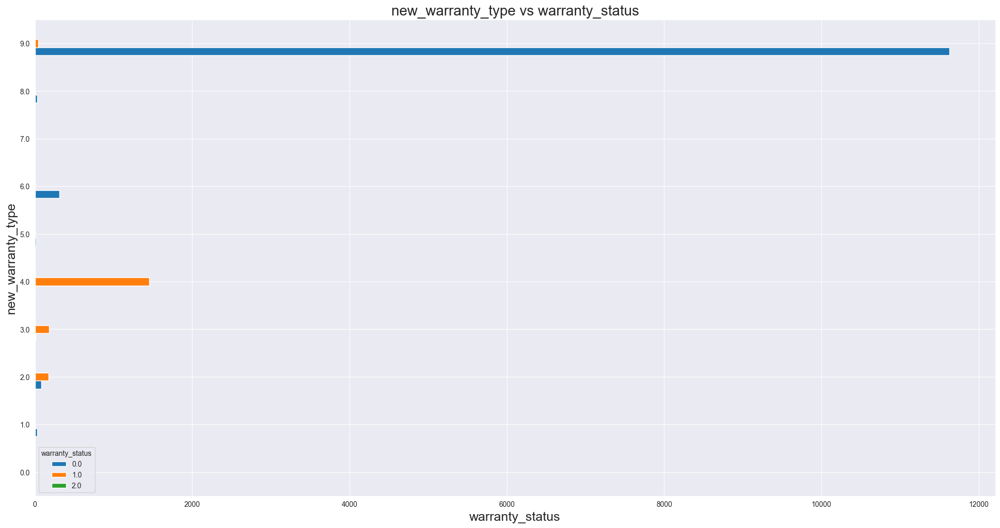

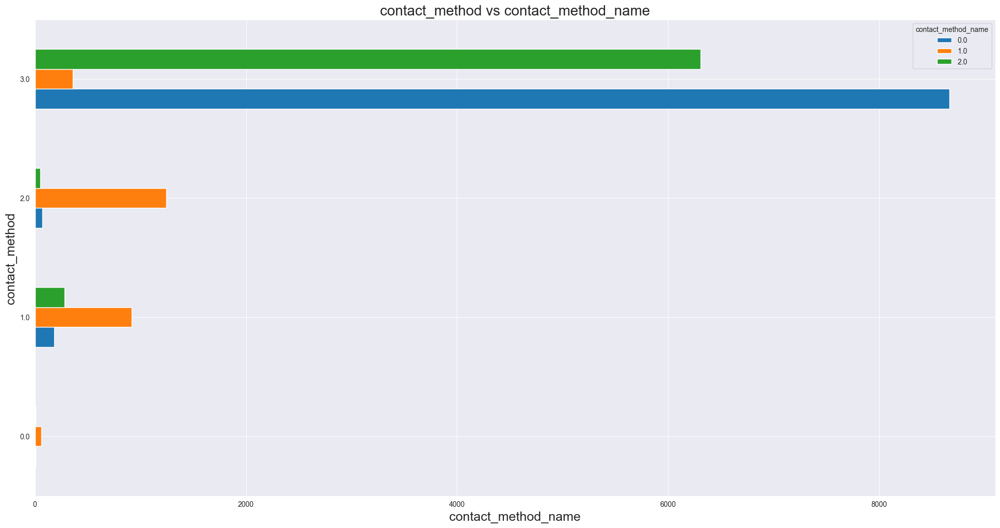

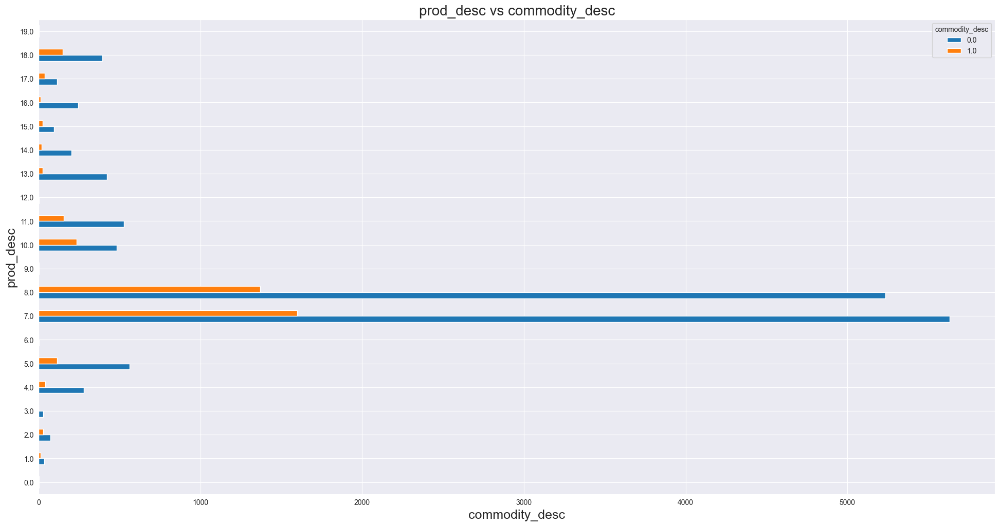

In [36]:
def plot_barh(df,col, y, cmap = None, stacked=False, norm = None):
    df.plot(kind='barh', colormap=cmap, stacked=stacked)
    fig = plt.gcf()
    fig.set_size_inches(24,12)
    plt.title("{} vs {}{}".format(y, col, '(Normalized)' if norm else ''), fontsize= 20)
    plt.ylabel(y, fontsize = 18)
    plot = plt.xlabel(col, fontsize=18)

def norm_counts(t):
    norms = np.linalg.norm(t.fillna(0), axis=1)
    t_norm = t[0:0]
    for row, euc in zip(t.iterrows(), norms):
        t_norm.loc[row[0]] = list(map(lambda x: x/euc, list(row[1])))
    return t_norm
g_by_category = df.groupby('new_warranty_type')
cat_fit = g_by_category['warranty_status'].value_counts()
cat_fit = cat_fit.unstack()
cat_fit_norm = norm_counts(cat_fit)
cat_fit_norm.drop(df['warranty_status'], axis=1, inplace=True)
plot_barh(cat_fit, 'warranty_status', 'new_warranty_type')
g_by_category = df.groupby('contact_method')
cat_fit = g_by_category['contact_method_name'].value_counts()
cat_fit = cat_fit.unstack()
cat_fit_norm = norm_counts(cat_fit)
cat_fit_norm.drop(df['contact_method_name'], axis=1, inplace=True)
plot_barh(cat_fit, 'contact_method_name', 'contact_method')
g_by_category = df.groupby('prod_desc')
cat_fit = g_by_category['commodity_desc'].value_counts()
cat_fit = cat_fit.unstack()
cat_fit_norm = norm_counts(cat_fit)
cat_fit_norm.drop(df['commodity_desc'], axis=1, inplace=True)
plot_barh(cat_fit, 'commodity_desc', 'prod_desc')

### Creating new dataframe with only top 5 countries

In [37]:
counts = df['country_name_dawn'].value_counts()

df2 = df[~df['country_name_dawn'].isin(counts[counts < 750].index)]

In [38]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13998 entries, 2 to 19988
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype          
---  ------                --------------  -----          
 0   case_nbr              13998 non-null  float64        
 1   created_dts           13998 non-null  datetime64[ns] 
 2   created_date          13998 non-null  datetime64[ns] 
 3   close_dts             13998 non-null  datetime64[ns] 
 4   last_updated_dts      13998 non-null  object         
 5   contact_method        13998 non-null  float64        
 6   tag_id                13998 non-null  float64        
 7   prod_desc             13998 non-null  float64        
 8   country_name_dawn     13998 non-null  object         
 9   contact_method_name   13998 non-null  float64        
 10  system_age            13998 non-null  float64        
 11  total_inbounf_count   13998 non-null  float64        
 12  commodity_desc        13998 non-null  float64        
 13  t

### Graph of activity vs date for new data frame

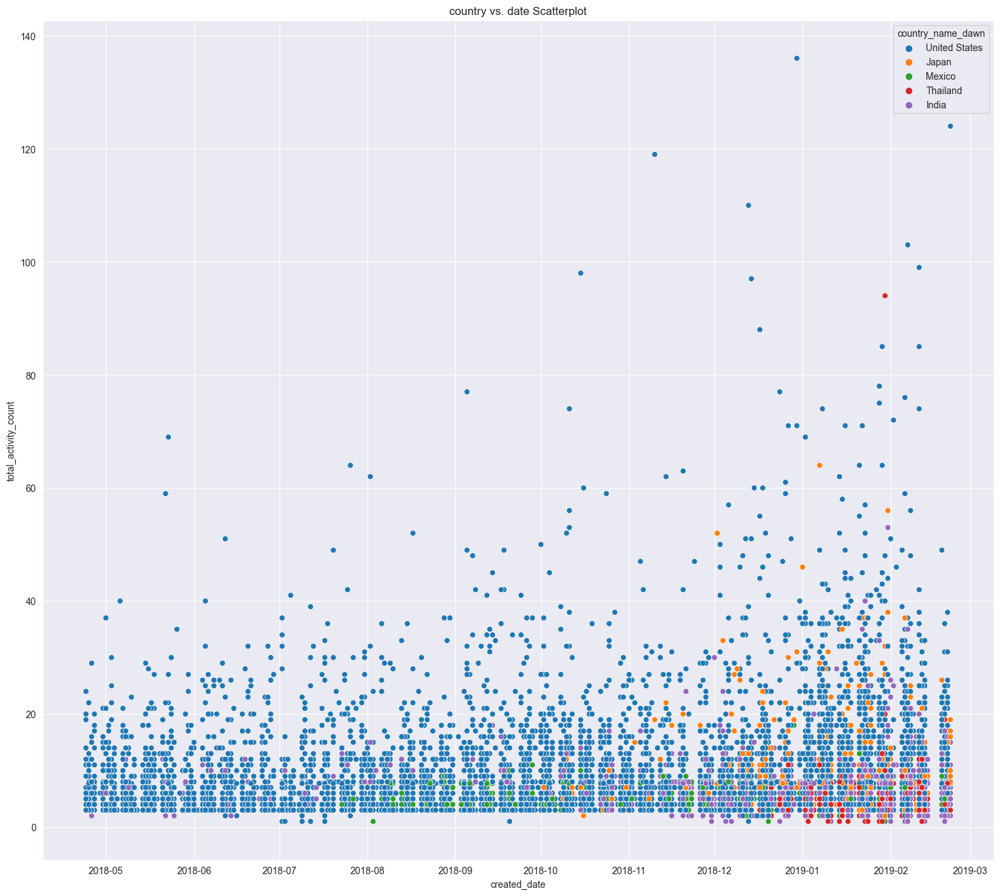

In [39]:
fig = plt.figure(figsize=(18,16))
sns.scatterplot(data=df2,x=df2.created_date, y=df2.total_activity_count, hue='country_name_dawn')
plt.title('country vs. date Scatterplot')

plt.show()

### Pairplot for relevant colums with new dataframe

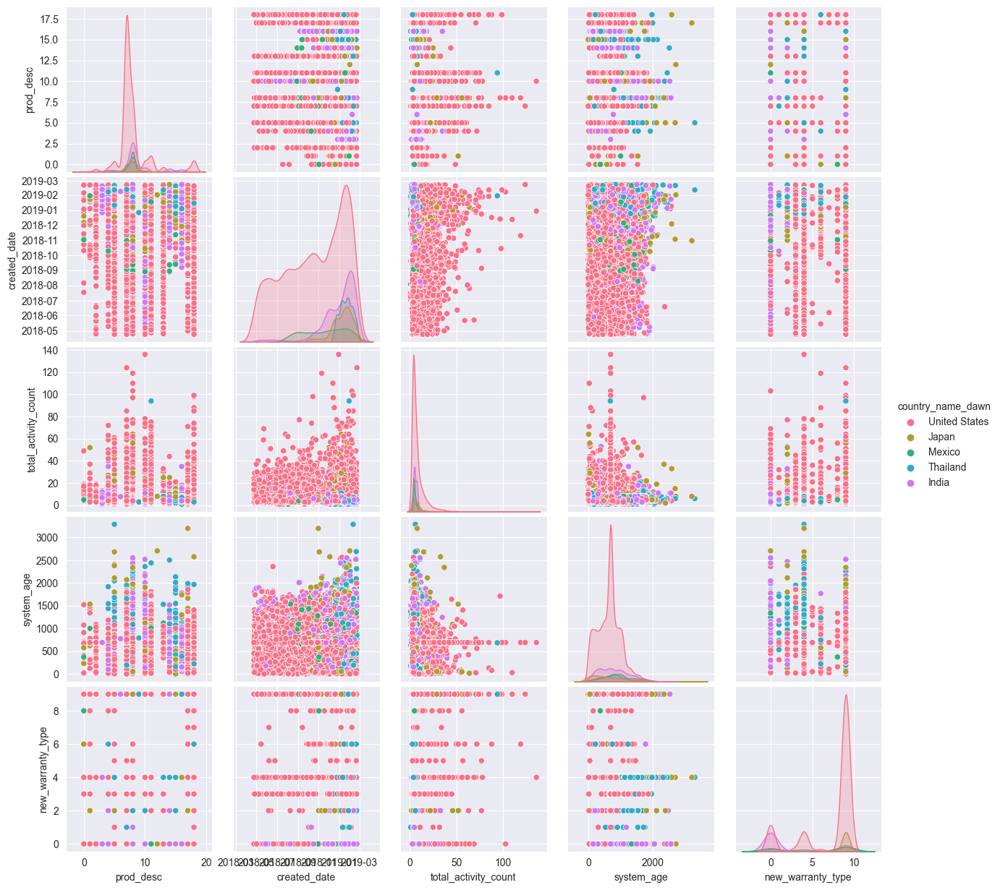

In [40]:
sns.pairplot(df2, vars=['prod_desc', 'created_date', 'total_activity_count', 'system_age',
                        'new_warranty_type'],size =2.5,hue='country_name_dawn', diag_kind = 'kde',kind = 'scatter',palette ='husl');

### Activity vs system age scatterplot(long line is mean of system_age)

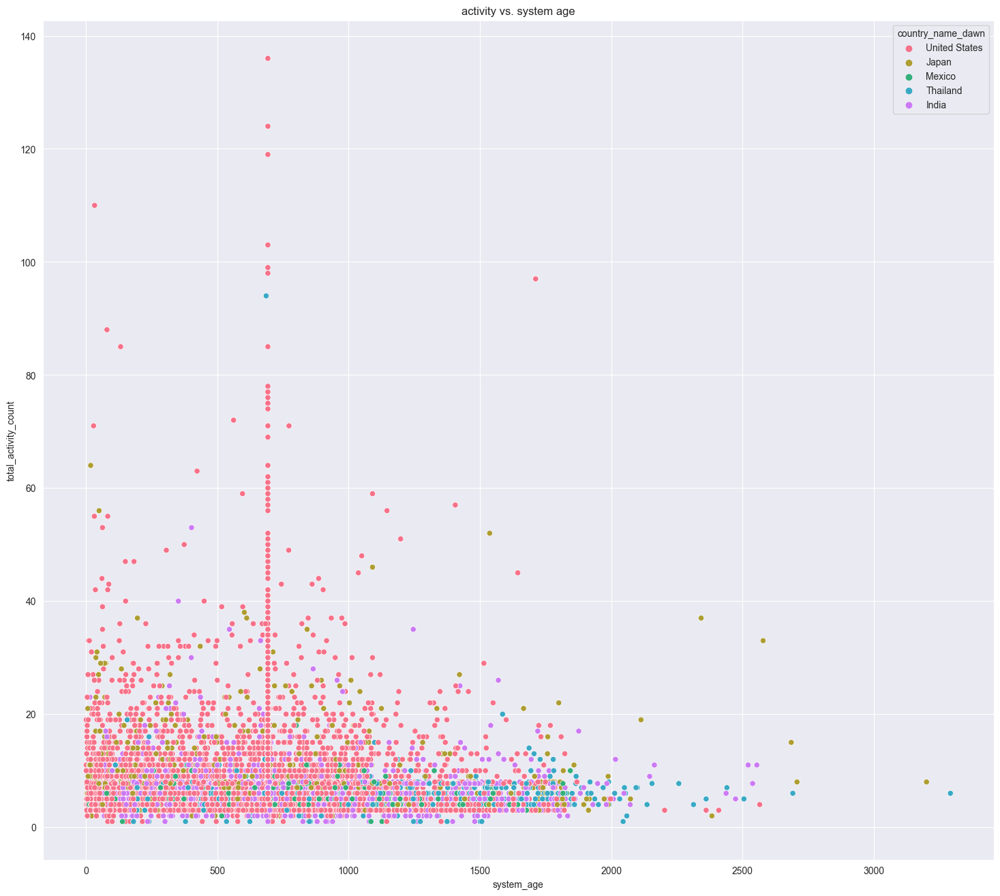

In [41]:
fig = plt.figure(figsize=(18,16))
sns.scatterplot(data=df2,x=df2.system_age, y=df2.total_activity_count, hue='country_name_dawn',
             palette ='husl')
plt.title('activity vs. system age')

plt.show()

In [42]:
df.system_age.mean()

695.5098306437176

### I recommend focusing on created_date, prod_desc, country_name_dawn, system_age, total_activity_count, new_warranty_type

### Adding Continent Column

In [43]:
asia = ['Afghanistan', 'Bahrain', 'United Arab Emirates','Saudi Arabia', 'Kuwait', 'Qatar', 'Oman',
       'Sultanate of Oman','Lebanon', 'Iraq', 'Yemen', 'Pakistan', 'Lebanon', 'Philippines', 'Jordan', 'Taiwan',
       'Indonesia', 'Singapore', 'China', 'Korea', 'Hong Kong', 'Malaysia', 'India', 'APJ Support', 'Japan', 'Thailand']
europe = ['Germany','Spain', 'France', 'Italy', 'Netherlands', 'Norway', 'Sweden','Czech Republic', 'Finland',
          'Denmark', 'Switzerland', 'United Kingdom', 'Ireland', 'Poland', 'Greece','Austria',
          'Bulgaria', 'Hungary', 'Luxembourg', 'Romania' , 'Slovakia', 'Estonia', 'Slovenia','Portugal',
          'Croatia', 'Lithuania', 'Latvia','Serbia', 'Estonia', 'Iceland', 'Western Europe' , 'CEE eCis' , 'Belgium']
sa =['Chile', 'Peru', 'Argentina', 'Colombia', 'Mexico', 'Brazil']
na = ['United States', 'Canada']
africa = ['South Africa']
oceania = ['Australia', 'New Zealand']


def GetConti(country):
    if country in asia:
        return "Asia"
    elif country in europe:
        return "Europe"
    elif country in africa:
        return "Africa"
    elif country in na:
        return "North America"
    elif country in sa:
        return "South America"
    elif country in oceania:
        return "Oceania"
    else:
        return "No country"


df['Continent'] = df['country_name_dawn'].apply(lambda x: GetConti(x))

In [44]:
df.head(10)

,case_nbr,created_dts,created_date,close_dts,last_updated_dts,contact_method,tag_id,prod_desc,country_name_dawn,contact_method_name,system_age,total_inbounf_count,commodity_desc,total_activity_count,warranty_status,new_warranty_type,journey_time,seconds,Continent
0,1.0,1900-01-01 00:12:00,2019-02-01,1900-01-01 00:57:26,00:46:57,2.0,1.0,8.0,United Kingdom,0.0,677.000000,4.0,1.0,9.000000,0.0,9.0,0 days 00:45:26,2726.000000,Europe
1,2.0,1900-01-01 00:11:48,2019-02-06,1900-01-01 00:39:52,00:12:16,3.0,2.0,4.0,New Zealand,2.0,1738.000000,3.0,1.0,7.000000,1.0,4.0,0 days 00:28:04,1684.000000,Oceania
2,3.0,1900-01-01 00:47:10,2018-10-05,1900-01-01 00:35:51,00:35:06,3.0,3.0,7.0,United States,0.0,692.562918,4.0,0.0,8.000000,1.0,4.0,0 days 00:19:23.595196190,1163.595196,North America
3,4.0,1900-01-01 00:52:45,2018-11-14,1900-01-01 00:27:59,00:49:22,3.0,4.0,8.0,United States,0.0,1075.000000,3.0,1.0,5.000000,0.0,9.0,0 days 00:19:23.595196190,1163.595196,North America
4,5.0,1900-01-01 00:59:46,2019-01-07,1900-01-01 00:57:15,00:31:51,3.0,5.0,11.0,United States,0.0,138.000000,3.0,0.0,5.000000,0.0,9.0,0 days 00:19:23.595196190,1163.595196,North America
5,6.0,1900-01-01 00:06:11,2018-10-31,1900-01-01 00:50:22,00:49:53,1.0,6.0,8.0,Japan,1.0,1799.000000,2.0,1.0,4.000000,0.0,9.0,0 days 00:44:11,2651.000000,Asia
6,7.0,1900-01-01 00:59:34,2018-06-26,1900-01-01 00:21:25,00:21:53,3.0,7.0,8.0,United States,0.0,123.000000,2.0,1.0,3.000000,0.0,9.0,0 days 00:19:23.595196190,1163.595196,North America
7,8.0,1900-01-01 00:34:37,2018-08-15,1900-01-01 00:48:29,00:47:51,3.0,8.0,8.0,Colombia,0.0,1324.000000,3.0,0.0,4.000000,0.0,9.0,0 days 00:13:52,832.000000,South America
8,9.0,1900-01-01 00:23:34,2018-12-11,1900-01-01 00:02:56,00:02:34,3.0,9.0,7.0,United States,0.0,1014.000000,3.0,0.0,5.000000,0.0,9.0,0 days 00:19:23.595196190,1163.595196,North America
10,11.0,1900-01-01 00:21:12,2018-10-11,1900-01-01 00:33:45,00:33:46,3.0,11.0,8.0,Mexico,0.0,1049.000000,2.0,0.0,7.726491,0.0,0.0,0 days 00:12:33,753.000000,South America


### Encoding Continents

In [45]:
from sklearn.preprocessing import OneHotEncoder
from sklearn import preprocessing

le = preprocessing.LabelEncoder()
df['continent_cat'] = le.fit_transform(df['Continent'])
enc = OneHotEncoder(sparse_output=True, dtype=int)
enc_df = pd.DataFrame(enc.fit_transform(df[['continent_cat']]).toarray())
df = df.join(enc_df)

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18146 entries, 0 to 19993
Data columns (total 27 columns):
 #   Column                Non-Null Count  Dtype          
---  ------                --------------  -----          
 0   case_nbr              18146 non-null  float64        
 1   created_dts           18146 non-null  datetime64[ns] 
 2   created_date          18146 non-null  datetime64[ns] 
 3   close_dts             18146 non-null  datetime64[ns] 
 4   last_updated_dts      18146 non-null  object         
 5   contact_method        18146 non-null  float64        
 6   tag_id                18146 non-null  float64        
 7   prod_desc             18146 non-null  float64        
 8   country_name_dawn     18146 non-null  object         
 9   contact_method_name   18146 non-null  float64        
 10  system_age            18146 non-null  float64        
 11  total_inbounf_count   18146 non-null  float64        
 12  commodity_desc        18146 non-null  float64        
 13  t

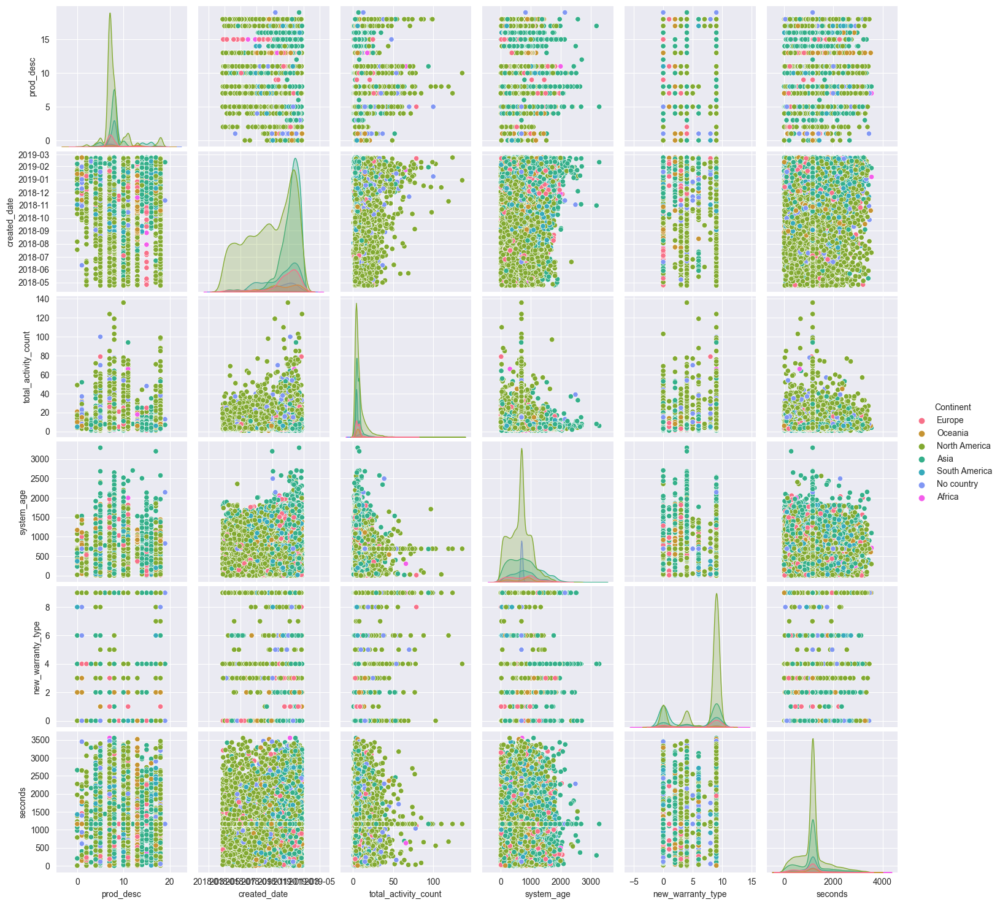

In [47]:
sns.pairplot(df, vars=['prod_desc', 'created_date', 'total_activity_count', 'system_age',
                       'new_warranty_type', 'seconds'],size =2.5,hue='Continent', diag_kind = 'kde',kind = 'scatter',palette ='husl');

In [48]:
df['date_delta'] = (df['created_date'] - df['created_date'].min())  / np.timedelta64(1,'D')

In [49]:
df.head(10)

,case_nbr,created_dts,created_date,close_dts,last_updated_dts,contact_method,tag_id,prod_desc,country_name_dawn,contact_method_name,...,Continent,continent_cat,0,1,2,3,4,5,6,date_delta
0,1.0,1900-01-01 00:12:00,2019-02-01,1900-01-01 00:57:26,00:46:57,2.0,1.0,8.0,United Kingdom,0.0,...,Europe,2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,283.0
1,2.0,1900-01-01 00:11:48,2019-02-06,1900-01-01 00:39:52,00:12:16,3.0,2.0,4.0,New Zealand,2.0,...,Oceania,5,0.0,0.0,0.0,0.0,0.0,1.0,0.0,288.0
2,3.0,1900-01-01 00:47:10,2018-10-05,1900-01-01 00:35:51,00:35:06,3.0,3.0,7.0,United States,0.0,...,North America,4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,164.0
3,4.0,1900-01-01 00:52:45,2018-11-14,1900-01-01 00:27:59,00:49:22,3.0,4.0,8.0,United States,0.0,...,North America,4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,204.0
4,5.0,1900-01-01 00:59:46,2019-01-07,1900-01-01 00:57:15,00:31:51,3.0,5.0,11.0,United States,0.0,...,North America,4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,258.0
5,6.0,1900-01-01 00:06:11,2018-10-31,1900-01-01 00:50:22,00:49:53,1.0,6.0,8.0,Japan,1.0,...,Asia,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,190.0
6,7.0,1900-01-01 00:59:34,2018-06-26,1900-01-01 00:21:25,00:21:53,3.0,7.0,8.0,United States,0.0,...,North America,4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,63.0
7,8.0,1900-01-01 00:34:37,2018-08-15,1900-01-01 00:48:29,00:47:51,3.0,8.0,8.0,Colombia,0.0,...,South America,6,0.0,0.0,0.0,0.0,0.0,0.0,1.0,113.0
8,9.0,1900-01-01 00:23:34,2018-12-11,1900-01-01 00:02:56,00:02:34,3.0,9.0,7.0,United States,0.0,...,North America,4,0.0,0.0,0.0,0.0,1.0,0.0,0.0,231.0
10,11.0,1900-01-01 00:21:12,2018-10-11,1900-01-01 00:33:45,00:33:46,3.0,11.0,8.0,Mexico,0.0,...,South America,6,0.0,1.0,0.0,0.0,0.0,0.0,0.0,170.0


### Feature selection
 X contains float values ('total_activity_count', 'system_age',
         'total_inbounf_count', 'date_delta', 'seconds'), while feature selection Y contains categorical values that are encoded ('prod_desc', 'continent_cat', 'new_warranty_type', 'commodity_desc', 'warranty_status')

In [50]:
X = df[[ 'total_activity_count', 'system_age',
         'total_inbounf_count', 'date_delta', 'seconds']]
X.head(2)


Y = df[['prod_desc', 'continent_cat', 'new_warranty_type', 'commodity_desc', 'warranty_status']]
Y.head(2)

,prod_desc,continent_cat,new_warranty_type,commodity_desc,warranty_status
0,8.0,2,9.0,1.0,0.0
1,4.0,5,4.0,1.0,1.0


In [51]:
from sklearn.cluster import KMeans, DBSCAN
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors

In [52]:

sc = StandardScaler()
sc2 = StandardScaler()
X = sc.fit_transform(X)
Y = sc2.fit_transform(Y)

### Dimensionality Reduction
 PCA technique for dimensionality reduction is used for this process. First, we create Scree plots to help us to select the best number of components for PCA. As below figure shows, the best number of components for each PCA is 3, because it’s described at least 80% of the variance. PCA encodes the most important relationships between the points: despite reducing the dimension of the data by 60%, the overall relationship between the data points are mostly preserved.

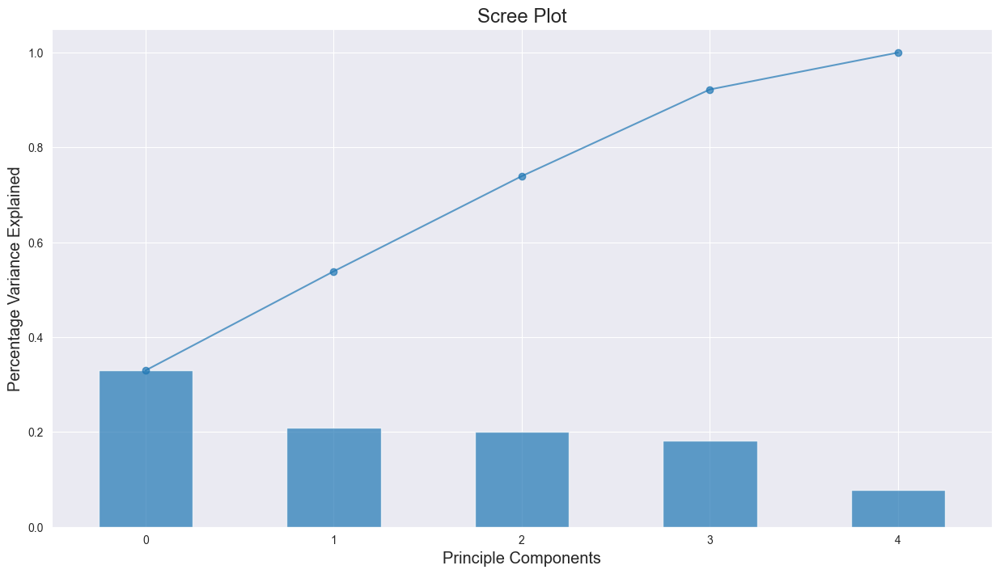

<Figure size 640x480 with 0 Axes>

In [53]:
pca = PCA()
pca.fit(X)
sns.color_palette("YlOrBr", as_cmap=True)
plt.figure(figsize=(15,8))
exp_var = pd.Series(pca.explained_variance_ratio_)
exp_var.plot(kind="bar", alpha=0.7) # plot bar chart

# Calculate the amount of variance explained added by each additional component
total = 0
var_ls = []
for x in exp_var:
    total = total+x
    var_ls.append(total)

pd.Series(var_ls).plot(marker="o", alpha=0.7) #plot line chart of increasing variances
plt.xlabel("Principle Components", fontsize="x-large")
plt.ylabel("Percentage Variance Explained", fontsize="x-large")
plt.title("Scree Plot", fontsize="xx-large")
plt.show();
plt.savefig("ScreePlot.png",dpi=150)

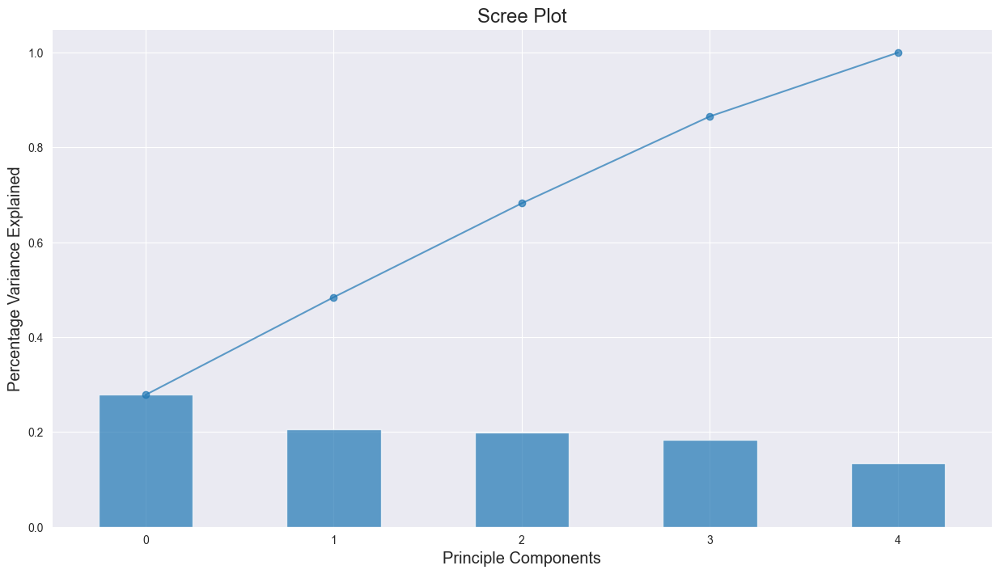

<Figure size 640x480 with 0 Axes>

In [54]:
pca = PCA()
pca.fit(Y)
sns.color_palette("YlOrBr", as_cmap=True)
plt.figure(figsize=(15,8))
exp_var = pd.Series(pca.explained_variance_ratio_)
exp_var.plot(kind="bar", alpha=0.7) # plot bar chart

# Calculate the amount of variance explained added by each additional component
total = 0
var_ls = []
for x in exp_var:
    total = total+x
    var_ls.append(total)

pd.Series(var_ls).plot(marker="o", alpha=0.7) #plot line chart of increasing variances
plt.xlabel("Principle Components", fontsize="x-large")
plt.ylabel("Percentage Variance Explained", fontsize="x-large")
plt.title("Scree Plot", fontsize="xx-large")
plt.show();
plt.savefig("ScreePlot.png",dpi=150)

In [55]:
pca = PCA(n_components=3)
X = pca.fit_transform(X)
X

array([[ 0.82876424, -0.14951524,  2.53239812],
       [ 0.10605183,  2.31297191,  1.65052363],
       [ 0.26060901, -0.34301016,  0.0390365 ],
       ...,
       [ 1.67722573,  0.77146377,  0.13979811],
       [ 7.15608843, -1.45766938, -0.47523594],
       [ 0.04092722, -1.20205332,  1.66160153]])

In [56]:
pca = PCA(n_components=3)
Y = pca.fit_transform(Y)
Y

array([[-0.85592269,  0.24463737,  1.24233559],
       [ 0.18227436,  3.77378534, -0.01680298],
       [ 1.45446118,  2.0093079 , -0.69357514],
       ...,
       [-0.43664439, -0.71324984,  0.42870133],
       [-0.57161985, -0.02422604,  1.28795629],
       [ 0.03610562, -0.8122559 ,  1.94555818]])

### Kmeans Clustering
Elbow method: This method calculates the variance between data points within a cluster using the Sum of Squared Error. The best value of k to select is the point of inflection on the curve. For X and Y this point is at 4 clusters.
Silhouette method: This method calculates the average silhouette value for each data point in the cluster, this value represents how similar a data point is to its own cluster. The clusters are chosen from there score(x-axis) and the uniformity of the size of the silhouette plots. For Y the silhouette method matches with the elbow method at 4 clusters. For X there is a slight differentiation between the two methods. While 4 clusters has the best uniformity of size for silhouette plots for X, 2 clusters has the best score. I have plotted both options for the purpose of this notebook.


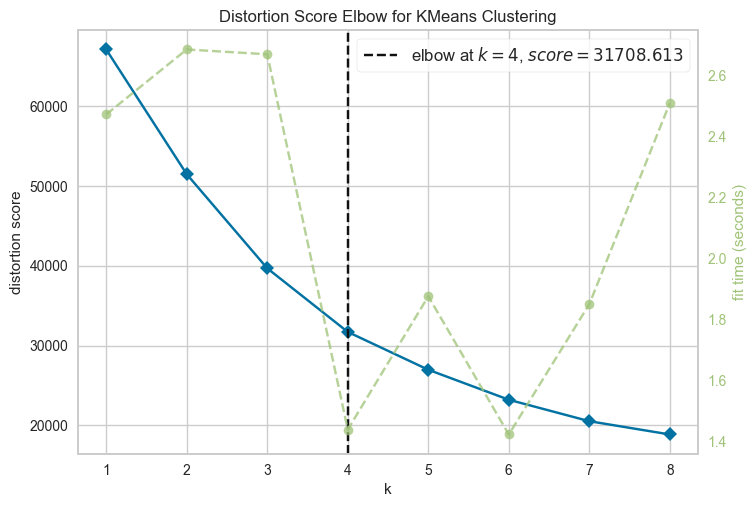

<AxesSubplot: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [57]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

from yellowbrick.cluster import KElbowVisualizer



# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,9))

visualizer.fit(X)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

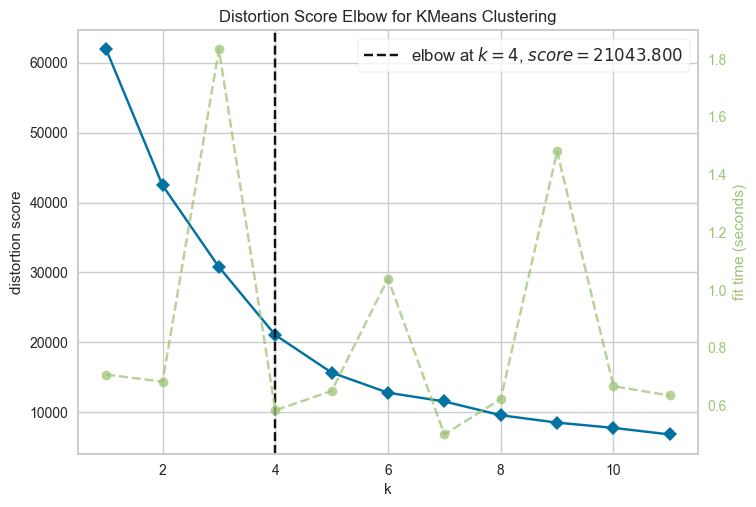

<AxesSubplot: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [58]:


# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,12))

visualizer.fit(Y)        # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

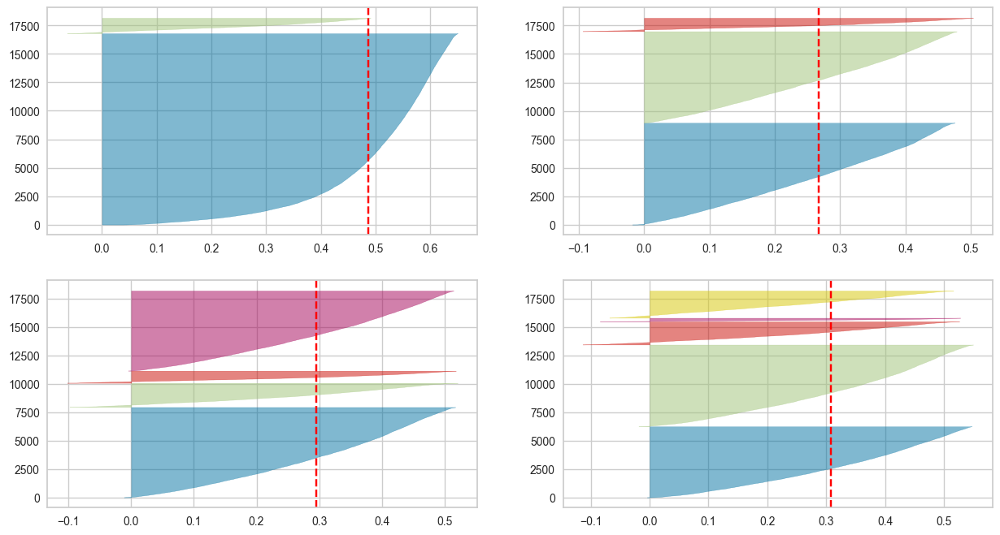

In [59]:
from yellowbrick.cluster import SilhouetteVisualizer

fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, random_state=42)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(X)

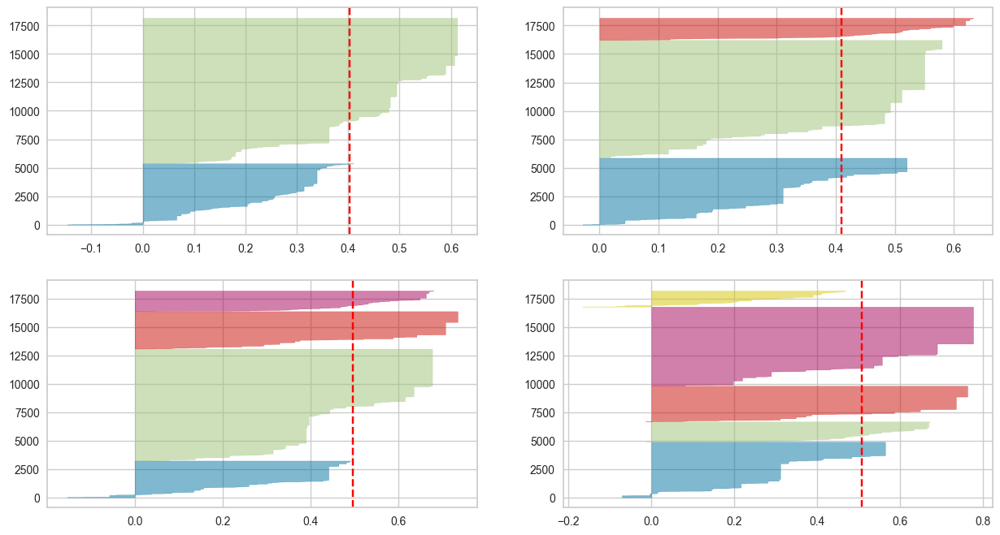

In [60]:
fig, ax = plt.subplots(2, 2, figsize=(15,8))
for i in [2, 3, 4, 5]:
    '''
    Create KMeans instance for different number of clusters
    '''
    km = KMeans(n_clusters=i, random_state=42)
    q, mod = divmod(i, 2)
    '''
    Create SilhouetteVisualizer instance with KMeans instance
    Fit the visualizer
    '''
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick', ax=ax[q-1][mod])
    visualizer.fit(Y)

In [61]:
# create a pipeline to scale data and
# Apply KMeans
kmean = KMeans(n_clusters=2)

kmean.fit(X)
y_pred = kmean.predict(X)
df['pred_cluster'] = y_pred

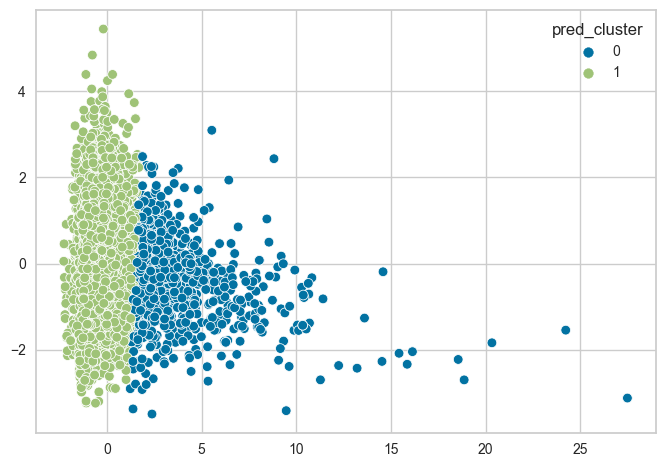

In [62]:
# Plot KMeans Results (2 dim)
sns.scatterplot(data = df, y= X[:,1], x= X[:,0], hue='pred_cluster');

In [63]:
kmean = KMeans(n_clusters=4)

kmean.fit(X)
y_pred = kmean.predict(X)
df['pred_cluster_alt'] = y_pred

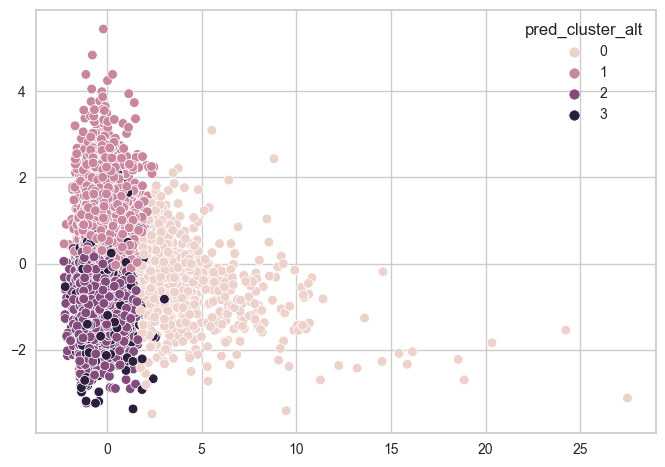

In [64]:
# Plot KMeans Results (2 dim)
sns.scatterplot(data = df, y= X[:,1], x= X[:,0], hue='pred_cluster_alt');

In [65]:
# create a pipeline to scale data and
# Apply KMeans
kmean = KMeans(n_clusters=4)

kmean.fit(Y)

y_pred = kmean.predict(Y)
df['pred_cluster_y'] = y_pred

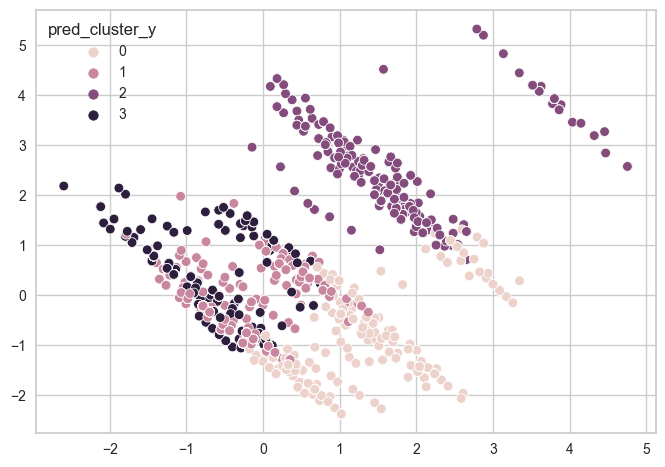

In [66]:
# Plot KMeans Results (2 dim)
sns.scatterplot(data = df, y= Y[:,1], x= Y[:,0], hue='pred_cluster_y');

In [76]:
import plotly.express as px
# 3d Scatter plot of clusters using K-means


fig = px.scatter_3d(X, x= X[:,0], y= X[:,1],z = X[:,2],
                    color=df['pred_cluster'], labels={'x':'Feature 1', 'y':'Feature 2','z':'Feature 3'} )
fig.show()


In [73]:
import plotly.express as px
# 3d Scatter plot of clusters using K-means


fig = px.scatter_3d(X, x= X[:,0], y= X[:,1],z = X[:,2],
                    color=df['pred_cluster_alt'], labels={'x':'Feature 1', 'y':'Feature 2','z':'Feature 3'} )
fig.show()


In [71]:
import os

if not os.path.exists("images"):
    os.mkdir("images")

In [75]:

fig = px.scatter_3d(Y, x= Y[:,0], y= Y[:,1],z = Y[:,2],
                    color=df['pred_cluster_y'], labels={'x':'Feature 1', 'y':'Feature 2','z':'Feature 3'} )
fig.show()


### Conclusions

* Timestamps still lose 46% of values due to close_dts being less than created_dts in those cases. I have filled the missing values in with the mean and used the journey_time is seconds in my analysis of feature selection X.
* Feature selection X contains float values ('total_activity_count', 'system_age',
         'total_inbounf_count', 'date_delta', 'seconds'), while feature selection Y contains categorical values that are encoded ('prod_desc', 'continent_cat', 'new_warranty_type', 'commodity_desc', 'warranty_status')
* PCA technique for dimensionality reduction is used for this process. First, we create Scree plots to help us to select the best number of components for PCA. As below figure shows, the best number of components for each PCA is 3, because it’s described at least 80% of the variance. PCA encodes the most important relationships between the points: despite reducing the dimension of the data by 60%, the overall relationship between the data points are mostly preserved.
* In principal component analysis, this relationship is quantified by finding a list of the *principal axes* in the data, and using those axes to describe the dataset. Using PCA for dimensionality reduction involves removing one or more of the smallest principal components, resulting in a lower-dimensional projection of the data that preserves the maximal data variance. The information along the least important principal axis or axes is removed, leaving only the component(s) of the data with the highest variance
* Kmeans is an unsupervised learning technique which searches for clusters within unlabelled data using the following principals:
     * The "cluster center" is the arithmetic mean of all the points belonging to the cluster.
     * Each point is closer to its own cluster center than to other cluster centers.
* To find the optimal number of clusters for both X and Y I used two methods:
    *  Elbow method: Elbow method: This method calculates the the Sum of Squared distance between data points within a cluster and the cluster centre (Distortion cost). The best value of k to select is the point of inflection on the curve. For X and Y this point is at 4 clusters. .
    * Silhouette method: This method calculates the average silhouette value for each data point in the cluster, this value represents how similar a data point is to its own cluster. The clusters are chosen from there score(x-axis) and the uniformity of the size of the silhouette plots. For Y the silhouette method matches with the elbow method at 4 clusters. For X there is a slight differentiation between the two methods. While 4 clusters has the best uniformity of size for silhouette plots for X, 2 clusters has the best score. I have plotted both options for the purpose of this notebook.


In [70]:
df.head(10)

,case_nbr,created_dts,created_date,close_dts,last_updated_dts,contact_method,tag_id,prod_desc,country_name_dawn,contact_method_name,...,1,2,3,4,5,6,date_delta,pred_cluster,pred_cluster_alt,pred_cluster_y
0,1.0,1900-01-01 00:12:00,2019-02-01,1900-01-01 00:57:26,00:46:57,2.0,1.0,8.0,United Kingdom,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,283.0,1,3,3
1,2.0,1900-01-01 00:11:48,2019-02-06,1900-01-01 00:39:52,00:12:16,3.0,2.0,4.0,New Zealand,2.0,...,0.0,0.0,0.0,0.0,1.0,0.0,288.0,1,1,2
2,3.0,1900-01-01 00:47:10,2018-10-05,1900-01-01 00:35:51,00:35:06,3.0,3.0,7.0,United States,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,164.0,1,2,2
3,4.0,1900-01-01 00:52:45,2018-11-14,1900-01-01 00:27:59,00:49:22,3.0,4.0,8.0,United States,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,204.0,1,1,3
4,5.0,1900-01-01 00:59:46,2019-01-07,1900-01-01 00:57:15,00:31:51,3.0,5.0,11.0,United States,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,258.0,1,2,1
5,6.0,1900-01-01 00:06:11,2018-10-31,1900-01-01 00:50:22,00:49:53,1.0,6.0,8.0,Japan,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,190.0,1,3,3
6,7.0,1900-01-01 00:59:34,2018-06-26,1900-01-01 00:21:25,00:21:53,3.0,7.0,8.0,United States,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,63.0,1,2,3
7,8.0,1900-01-01 00:34:37,2018-08-15,1900-01-01 00:48:29,00:47:51,3.0,8.0,8.0,Colombia,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,113.0,1,1,1
8,9.0,1900-01-01 00:23:34,2018-12-11,1900-01-01 00:02:56,00:02:34,3.0,9.0,7.0,United States,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,231.0,1,1,1
10,11.0,1900-01-01 00:21:12,2018-10-11,1900-01-01 00:33:45,00:33:46,3.0,11.0,8.0,Mexico,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,170.0,1,1,1
